<a href="https://colab.research.google.com/github/javeedakthar/git-github/blob/master/bth_grp14_ml_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#BTH MACHINE LEARNING PROJECT GRP14 - Forest and CO2 Emissions Monitoring using Machine Learning


## Introduction
The project aims to monitor and analyze the forest cover in the Niokolokoba region using geospatial data techniques. The analysis involves predicting forest cover changes over the years, calculating carbon emissions from deforestation, estimating carbon stock, and visualizing the results on an interactive map. This project leverages satellite imagery and machine learning (deep learning) models to achieve these objectives.


## Methodology
The methodology involves several steps:
1. **Data Collection**: Satellite imagery is collected for the Niokolokoba region.
2. **Forest Prediction**: Machine learning models are used to predict forest cover for subsequent years.
3. **Carbon Calculations**: Using the predicted forest cover, we calculate potential carbon emissions and carbon stock.
4. **Visualization**: The data is visualized on a map, providing an interactive tool to monitor forests.


## Objective
Analyze the dynamics of the Niokolokoba forest in terms of deforestation, reforestation, carbon emissions, and carbon stock using satellite images and machine learning predictions.

---

## 1. Data Collection
- Satellite images of the Niokolokoba forest from 2013 to 2020.
- Forest cover predictions stored as '.tif' files for each year.

---

## 2. Preliminary Analysis
- Visualization of images using `rasterio` and `matplotlib`.

---

## 3. Carbon Emission Calculation
- Identification of deforested areas each year.
- Emissions calculated using the average carbon density.

---

## 4. Carbon Stock Calculation
- Estimation of the carbon stored in the existing forest cover.

---

## 5. Visualization on Map
- Interactive map created with `Folium` showing predictions and calculations.

---

## 6. Deforestation and Reforestation Analysis
- Identification and visualization of deforestation and reforestation areas.

---

## 7. User Interface
- Layer controls, legends, tooltips, and popups added for interactivity.

---

## 8. Challenges and Solutions
- Alignment of images and correct representation of carbon stock among the addressed challenges.

---

## 9. Conclusion
Valuable insights into the health of the Niokolokoba forest have been obtained, with an interactive map for stakeholders.



## NDVI Calculation and Visualization

First, we determine the health of the vegetation using the NDVI (Normalized Difference Vegetation Index). This index uses satellite imagery, particularly the NIR (near-infrared) and Red bands, to provide a measure of vegetation health.

By calculating the NDVI, we obtain a visual representation where healthy vegetation appears green, and areas with little or no vegetation appear in shades of red.

Once the NDVI is obtained, we further segment the imagery into vegetated areas (shown in white) and non-vegetated areas (shown in black) to clearly identify the regions of vegetation.

---


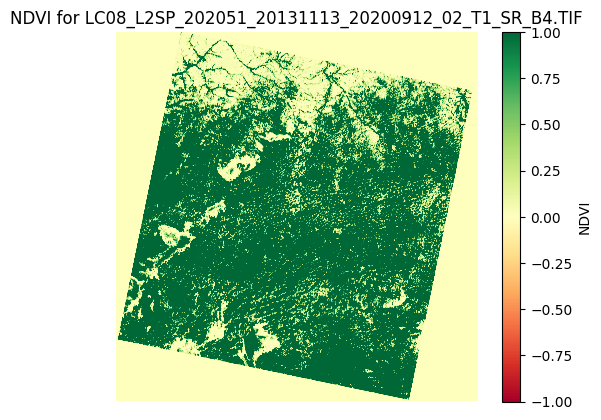

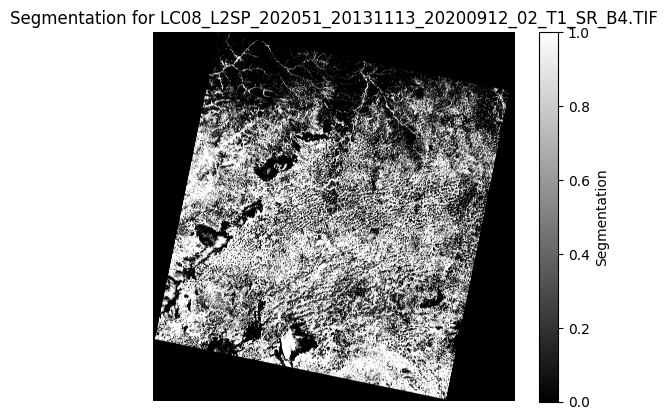

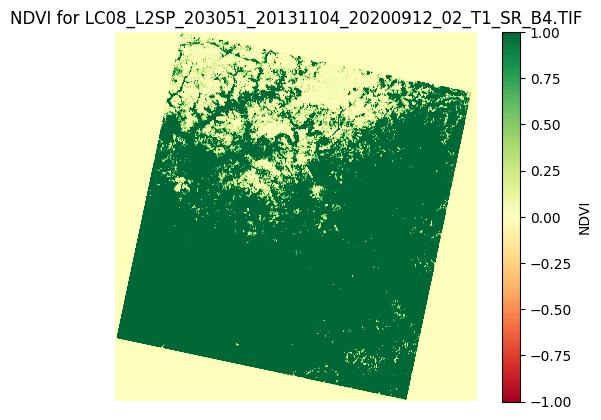

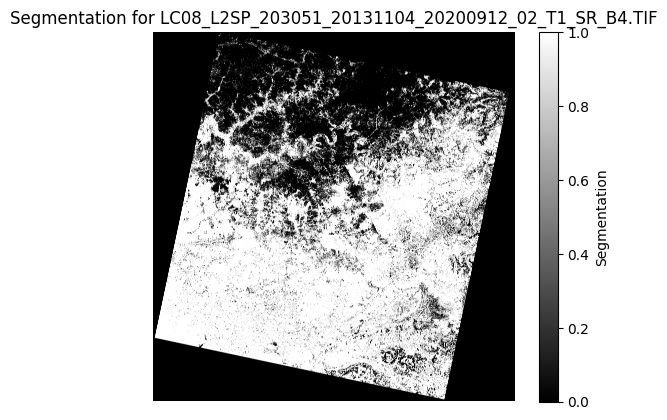

In [ ]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def compute_ndvi(nir_path, red_path):
    with rasterio.open(nir_path) as nir_src:
        nir_data = nir_src.read(1)
    with rasterio.open(red_path) as red_src:
        red_data = red_src.read(1)

    # NDVI calculation
    ndvi = (nir_data - red_data) / (nir_data + red_data + 1e-8)
    return ndvi

def threshold_segmentation(ndvi_data, threshold=0.2):
    # Binary segmentation based on NDVI threshold
    # Vegetation areas will be marked as 1 and non-vegetation as 0
    return (ndvi_data > threshold).astype(np.uint8)

# Directory containing your files
dir_path = "."

# Retrieve B3 and B4 files
b3_files = sorted([os.path.join(dir_path, f) for f in os.listdir(dir_path) if 'B3' in f])
b4_files = sorted([os.path.join(dir_path, f) for f in os.listdir(dir_path) if 'B4' in f])

for b3_path, b4_path in zip(b3_files, b4_files):
    ndvi_data = compute_ndvi(b4_path, b3_path)  # B4 is NIR and B3 is Red

    # Display NDVI
    plt.imshow(ndvi_data, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.colorbar(label='NDVI')
    plt.title(f"NDVI for {os.path.basename(b4_path)}")
    plt.axis('off')
    plt.show()

    segmented_data = threshold_segmentation(ndvi_data)

    # Display Segmentation
    plt.imshow(segmented_data, cmap='gray')
    plt.colorbar(label='Segmentation')
    plt.title(f"Segmentation for {os.path.basename(b4_path)}")
    plt.axis('off')
    plt.show()


## Merging Raster Images

To get a comprehensive view of an area, it is sometimes necessary to merge or assemble multiple satellite images. Here, we combine two images from the year 2013 to demonstrate this process.

The side-by-side display shows the two original images and the resulting merged image.

---


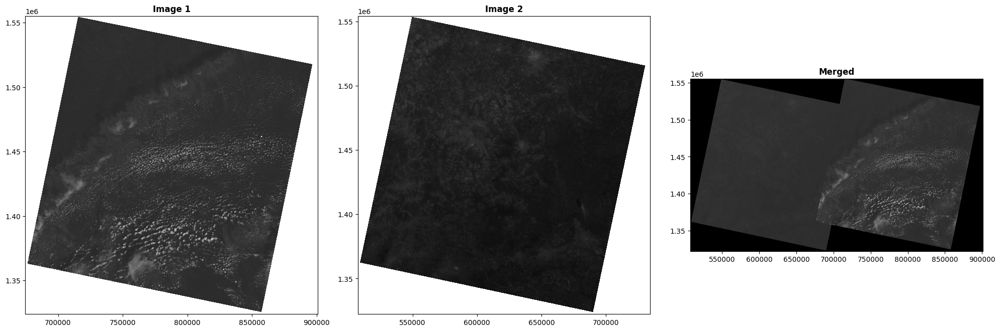

In [ ]:
import rasterio
from rasterio.merge import merge
from rasterio.plot import show
import os
import matplotlib.pyplot as plt

# Define paths
dir_path = "."
b3_files = sorted([os.path.join(dir_path, f) for f in os.listdir(dir_path) if 'B3' in f])

# Get the B3 files for 2013 (or any other year you want to test)
b3_files_year = [file for file in b3_files if "2013" in file]

# Check if there are at least two files
if len(b3_files_year) < 2:
    raise ValueError("There are not enough B3 files for the year 2013 to merge.")

# Open the two raster images
src1 = rasterio.open(b3_files_year[0])
src2 = rasterio.open(b3_files_year[1])

# Merge them directly using the rasterio.merge.merge() function
merged_data, merged_transform = merge([src1, src2])

# Display the result
fig, axs = plt.subplots(1, 3, figsize=(20, 20))

show(src1, ax=axs[0], cmap='gray', title="Image 1")
show(src2, ax=axs[1], cmap='gray', title="Image 2")
show(merged_data, ax=axs[2], transform=merged_transform, cmap='gray', title="Merged")

plt.tight_layout()
plt.show()


### Forest Cover Modeling Using Deep Learning

#### 1. **Data Preprocessing**:
- We define the paths to the mosaic files that contain the satellite images.
- The first 6 years of data are used for training, and the last 2 years are used for evaluation.

#### 2. **Data Labeling**:
- Using NDVI (Normalized Difference Vegetation Index) images, we label areas as forest or non-forest.
- Regions with high NDVI values are considered forests, while those with low NDVI values are considered non-forests.

#### 3. **Patch Extraction**:
- We extract patches or segments from the images.
- Patches with high NDVI values are classified as forest, while those with low NDVI values are classified as non-forest.
- These patches serve as training data for our model.

#### 4. **Data Augmentation**:
- To increase the amount of training data and make the model more robust, we use data augmentation techniques such as rotating and flipping the images.

#### 5. **Model Definition**:
We use a Convolutional Neural Network (CNN) model with the following architecture:
\```
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
=================================================================
Conv2D (Conv2D)              (None, 48, 48, 32)        320       
_________________________________________________________________
MaxPooling2D (MaxPooling2D)  (None, 24, 24, 32)        0         
_________________________________________________________________
Conv2D (Conv2D)              (None, 22, 22, 64)        18496     
_________________________________________________________________
MaxPooling2D (MaxPooling2D)  (None, 11, 11, 64)        0         
_________________________________________________________________
Flatten (Flatten)            (None, 7744)              0         
_________________________________________________________________
Dense (Dense)                (None, 64)                495680    
_________________________________________________________________
Dense (Dense)                (None, 1)                 65        
=================================================================
\```

#### 6. **Model Training**:
- We compile the model using the 'adam' optimizer and the 'binary_crossentropy' loss function.
- The model is trained on the training data for 10 epochs.
- We also validate the model using the evaluation data.

#### 7. **Model Evaluation**:
- After training, we evaluate the model's performance on the evaluation data.
- We calculate several metrics such as accuracy, recall, F1 score, and precision.

#### 8. **Model Saving**:
- Finally, we save the trained model for future use.

In [ ]:
import os
import numpy as np
import rasterio
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import tensorflow as tf
from imgaug import augmenters as iaa

# Define the mosaic directory
mosaic_dir = "./mosaics"
b3_files = sorted([os.path.join(mosaic_dir, f) for f in os.listdir(mosaic_dir) if 'B3' in f])
b4_files = sorted([os.path.join(mosaic_dir, f) for f in os.listdir(mosaic_dir) if 'B4' in f])

# Use the first 6 years for training and the last 2 for evaluation
train_b3_files = b3_files[:-2]
train_b4_files = b4_files[:-2]
eval_b3_files = b3_files[-2:]
eval_b4_files = b4_files[-2:]

# Function to extract patches based on NDVI values
def extract_patches(image, patch_size=50, stride=25, threshold=0.5):
    forest_patches = []
    non_forest_patches = []
    for i in range(0, image.shape[0] - patch_size, stride):
        for j in range(0, image.shape[1] - patch_size, stride):
            patch = image[i:i+patch_size, j:j+patch_size]
            mean_ndvi = np.mean(patch)
            if mean_ndvi > threshold:
                forest_patches.append(patch)
            elif mean_ndvi < 0.2:
                non_forest_patches.append(patch)
    return forest_patches, non_forest_patches

# Extract patches from mosaic images
def get_data_from_files(b3_files, b4_files):
    all_forest_patches = []
    all_non_forest_patches = []
    for b3_path, b4_path in zip(b3_files, b4_files):
        with rasterio.open(b4_path) as nir_src:
            nir_data = nir_src.read(1)
        with rasterio.open(b3_path) as red_src:
            red_data = red_src.read(1)
        ndvi_data = (nir_data - red_data) / (nir_data + red_data + 1e-8)

        forest_patches, non_forest_patches = extract_patches(ndvi_data)
        all_forest_patches.extend(forest_patches)
        all_non_forest_patches.extend(non_forest_patches)
    return all_forest_patches, all_non_forest_patches

train_forest, train_non_forest = get_data_from_files(train_b3_files, train_b4_files)
eval_forest, eval_non_forest = get_data_from_files(eval_b3_files, eval_b4_files)

# Data Augmentation
seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Rot90((1, 3))
])

train_forest_augmented = seq(images=train_forest)
train_non_forest_augmented = seq(images=train_non_forest)

X_train = train_forest_augmented + train_non_forest_augmented
y_train = [1]*len(train_forest_augmented) + [0]*len(train_non_forest_augmented)

X_eval = eval_forest + eval_non_forest
y_eval = [1]*len(eval_forest) + [0]*len(eval_non_forest)

# Model
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(50, 50, 1)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(np.array(X_train), np.array(y_train), epochs=10, batch_size=32, validation_data=(np.array(X_eval), np.array(y_eval)))

# Evaluation
y_pred = model.predict(np.array(X_eval))
y_pred_class = [1 if p > 0.5 else 0 for p in y_pred]

accuracy = accuracy_score(y_eval, y_pred_class)
precision = precision_score(y_eval, y_pred_class)
recall = recall_score(y_eval, y_pred_class)
f1 = f1_score(y_eval, y_pred_class)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Save the model
model.save("./forest_model.h5")


### Model Training Explanation

The model training process involves several steps aimed at preparing the data, defining a suitable model, training it, and evaluating its performance. Below is an explanation of each step, the choices made, and the reasoning behind these choices.

#### Data Preprocessing
Data preprocessing is crucial for ensuring that the satellite images are in a suitable format for analysis. We define the paths to the mosaic files containing the satellite images and organize the data into training and evaluation sets. This organization helps in efficiently managing and accessing the data.

#### Patch Extraction
Patches or segments are extracted from the NDVI (Normalized Difference Vegetation Index) images. The NDVI values are used to classify the patches into forest and non-forest categories. High NDVI values indicate forest areas, while low values indicate non-forest areas. This step helps in localizing the analysis to smaller, manageable parts of the images, making it easier for the model to learn the characteristics of forests and non-forests.

#### Data Augmentation
Data augmentation is used to increase the quantity and diversity of the training data. Techniques such as flipping and rotating the images are applied to the patches. This process helps prevent overfitting by making the model more robust to variations in the data. It ensures that the model does not just memorize the training data but learns to generalize to new, unseen data.

#### Model Definition
A Convolutional Neural Network (CNN) is defined using TensorFlow and Keras. CNNs are particularly well-suited for image classification tasks because they can capture spatial hierarchies in images through convolutional layers. The architecture typically includes multiple convolutional and pooling layers followed by dense layers. This structure allows the model to learn complex patterns and features in the images.

##### Why CNN?
- **Spatial Hierarchies**: CNNs are excellent at capturing spatial hierarchies in images, which is essential for understanding the intricate details of satellite imagery.
- **Efficiency**: CNNs are efficient in terms of parameter sharing and computation, making them suitable for processing large image datasets.
- **Proven Success**: CNNs have a proven track record in image classification tasks across various domains, making them a reliable choice.

#### Training the Model
The model is trained using the augmented patches with binary labels (forest or non-forest). The 'adam' optimizer and 'binary_crossentropy' loss function are used. The Adam optimizer is chosen for its efficiency and adaptability in handling sparse gradients and noisy problems. The binary crossentropy loss function is appropriate for binary classification tasks, where the goal is to distinguish between two classes.

##### Why Adam Optimizer?
- **Adaptive Learning Rates**: Adam adjusts the learning rates during training, which helps in faster convergence and better performance.
- **Handling Sparse Gradients**: It is particularly effective in problems with sparse gradients, which can be common in high-dimensional data like images.

##### Why Binary Crossentropy?
- **Binary Classification**: Binary crossentropy is designed for binary classification tasks, making it suitable for distinguishing between forest and non-forest areas.
- **Probabilistic Interpretation**: It provides a probabilistic interpretation of the model’s output, which is useful for making confident predictions.

#### Model Evaluation
The model's performance is evaluated on the validation data using metrics such as accuracy, precision, recall, and F1 score. These metrics provide a comprehensive understanding of the model's performance:
- **Accuracy**: Measures the overall correctness of the model.
- **Precision**: Indicates how many of the predicted positive instances are actually positive.
- **Recall**: Reflects how many actual positive instances are correctly predicted by the model.
- **F1 Score**: A harmonic mean of precision and recall, providing a balanced measure of the model's performance.

#### Model Saving
Finally, the trained model is saved for future use. This allows us to deploy the model for predicting forest cover on new satellite images without retraining, saving time and computational resources.

### Alternatives and Choices
- **Alternative Models**: While CNNs are the preferred choice for image classification, other models like Random Forests or Support Vector Machines (SVMs) could be considered. However, these models may not capture spatial hierarchies as effectively as CNNs.
- **Data Augmentation Techniques**: Different augmentation techniques such as color adjustments or adding noise could also be explored to further enhance the robustness of the model.
- **Optimization Algorithms**: Other optimizers like RMSprop or SGD could be used, but Adam is generally more efficient and effective for a wide range of problems.

Overall, the chosen methodologies and algorithms aim to balance complexity, performance, and robustness, ensuring that the model can accurately predict forest cover from satellite images.


## Loading and Visualizing Predicted Forest Cover

After calculating the NDVI and merging the images, we use a set of predicted forest cover images. These predictions provide insights into the changes in forest cover over the years.

For each predicted year, we visualize:
- The NDVI, indicating vegetation health.
- The NIR band, a component of the satellite image useful for vegetation analysis.
- The predicted forest cover, showing forest areas in green.

---

## Predicting Forest Cover Using Our Model

We use a pre-trained model to predict the forest cover from satellite images. The predictions are based on the color bands of the satellite imagery as well as other relevant features. The model generates a binary map where regions predicted to be forests are marked in white, while other regions are in black.

Once these predictions are generated, we combine them with NDVI data and other metrics to get a complete picture of the forest's health and cover.


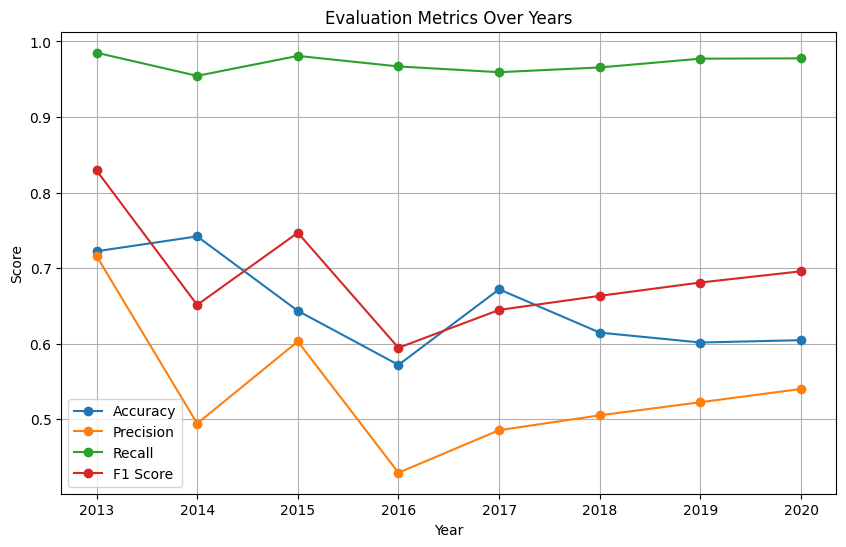

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import zipfile

# If you're in Jupyter Notebook, use the following line:
%matplotlib inline

predicted_dir = "./predicted"

# Path to the zipped .npy file
zipped_npy_path = os.path.join(predicted_dir, 'predicted_images.zip')

with zipfile.ZipFile(zipped_npy_path, 'r') as zip_ref:
    # Assuming there's only one .npy file in the zip, extract its name
    npy_file_name = zip_ref.namelist()[0]

    # Load the .npy file directly from the zip
    with zip_ref.open(npy_file_name) as file:
        predicted_images = np.load(file)

# The rest of your files appear to be local, so you can continue loading them as you were before:
accuracies = np.load(os.path.join(predicted_dir, 'accuracies.npy'))
precisions = np.load(os.path.join(predicted_dir, 'precisions.npy'))
recalls = np.load(os.path.join(predicted_dir, 'recalls.npy'))
f1_scores = np.load(os.path.join(predicted_dir, 'f1_scores.npy'))

predicted_image_files = sorted([os.path.join(predicted_dir, f) for f in os.listdir(predicted_dir) if f.endswith('.tif')])
years = [os.path.basename(f)[-8:-4] for f in predicted_image_files]

# Plotting the evaluation metrics
plt.figure(figsize=(10, 6))
plt.plot(years, accuracies, '-o', label='Accuracy')
plt.plot(years, precisions, '-o', label='Precision')
plt.plot(years, recalls, '-o', label='Recall')
plt.plot(years, f1_scores, '-o', label='F1 Score')
plt.legend()
plt.title('Evaluation Metrics Over Years')
plt.xlabel('Year')
plt.ylabel('Score')
plt.grid(True)
plt.savefig("./metrics_over_years.png")
plt.show()


### Evaluation Metrics Over Years

The graph shows the evaluation metrics for the forest cover prediction model over the years. The metrics include Accuracy, Precision, Recall, and F1 Score.

#### Accuracy
- The accuracy metric measures the overall correctness of the model.
- The accuracy starts at around 0.75 in 2013, dips in 2014, and fluctuates over the years, reaching a stable point around 0.65 from 2018 onwards.

#### Precision
- Precision indicates the proportion of true positive predictions among all positive predictions.
- Precision starts at around 0.7 in 2013, drops significantly in 2014, and shows a sharp increase in 2015.
- After 2016, precision steadily increases, reaching around 0.6 by 2020.

#### Recall
- Recall measures the proportion of actual positive instances correctly predicted by the model.
- Recall remains high throughout the years, starting at around 0.9 in 2013 and stabilizing around 0.95 from 2015 onwards.
- This indicates that the model is consistently good at identifying actual forest areas.

#### F1 Score
- The F1 score is the harmonic mean of precision and recall, providing a balance between the two.
- The F1 score starts at around 0.8 in 2013, drops in 2014, and shows fluctuations over the years.
- There is a noticeable dip in 2016, after which it gradually increases, reaching around 0.7 by 2020.

### Summary

- **Accuracy**: The model's overall accuracy has some fluctuations but stabilizes around 0.65 in the later years, indicating consistent performance.
- **Precision**: The precision shows significant improvement over the years, particularly after 2016, indicating fewer false positives in predictions.
- **Recall**: The recall remains high, indicating the model's strong ability to correctly identify forest areas throughout the years.
- **F1 Score**: The F1 score shows a balanced performance, with improvements over time, suggesting that the model is increasingly balancing precision and recall effectively.

Overall, the evaluation metrics indicate that the model has become more reliable and balanced in its predictions over the years, with significant improvements in precision and a consistently high recall.


## Forest Conservation Metrics Over Time

Forests play a crucial role in carbon sequestration, helping to mitigate climate change. We analyze our data to provide information on:
- The extent of forest cover over different years.
- The amount of carbon stored in these forests.
- The carbon emissions resulting from deforestation.

The visualizations offer insights into the area of forest cover, the carbon stored in the forest (carbon stock), and the carbon released due to deforestation (carbon emissions) over the years.

---


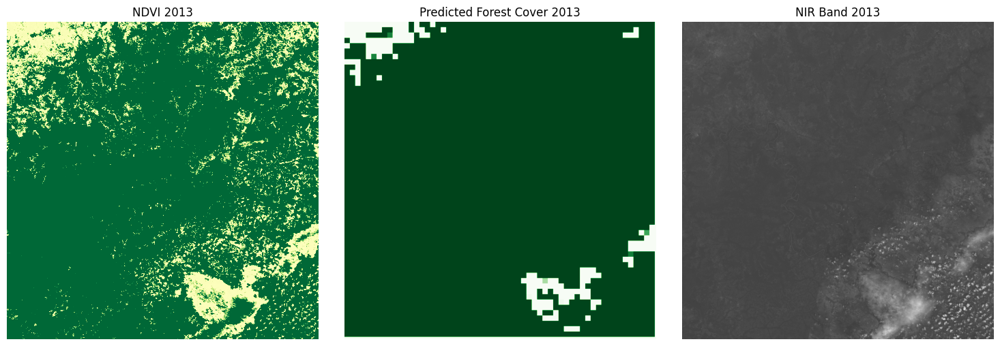

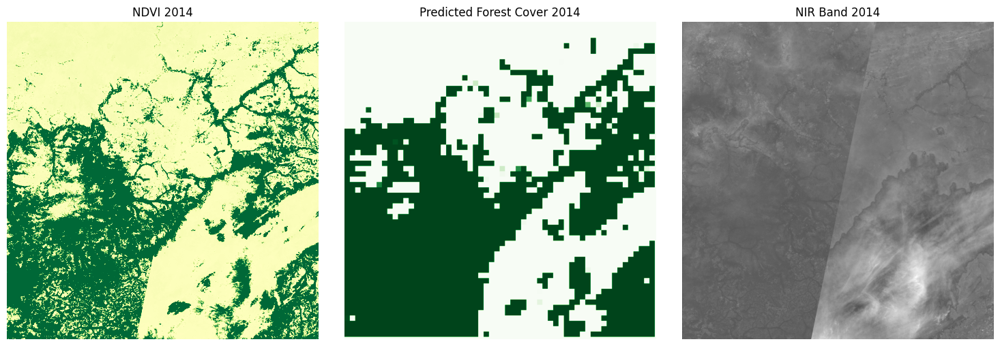

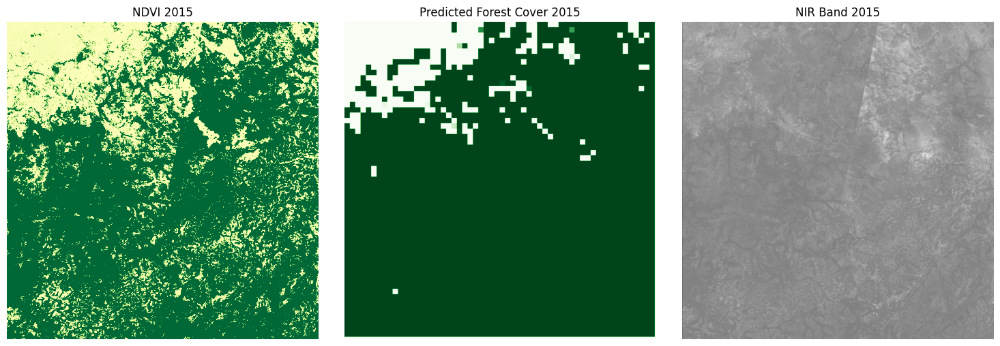

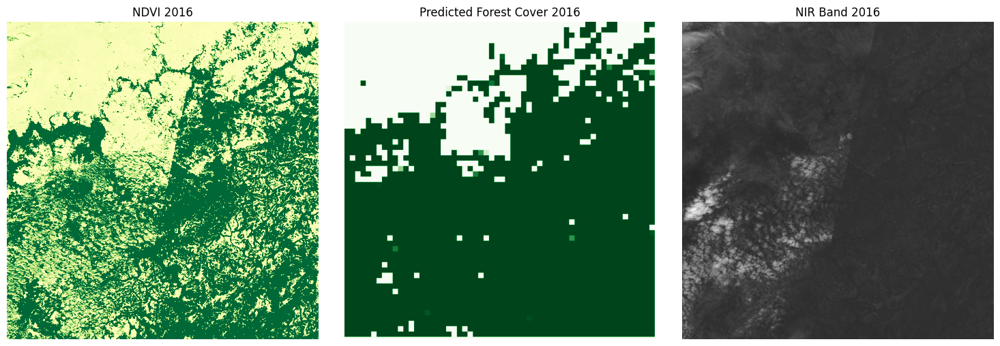

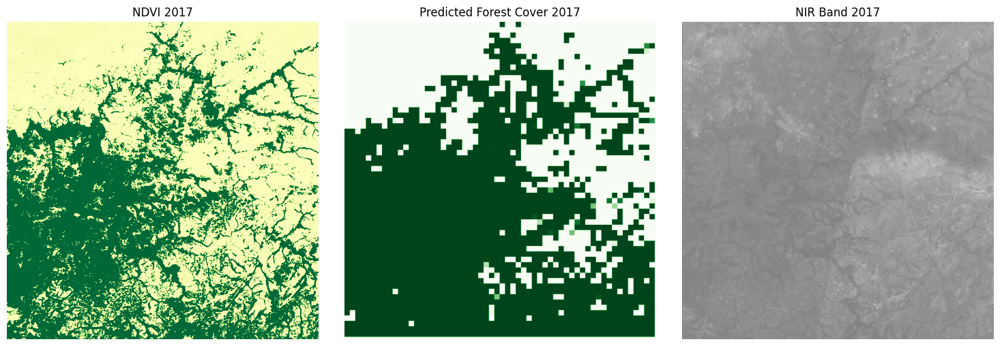

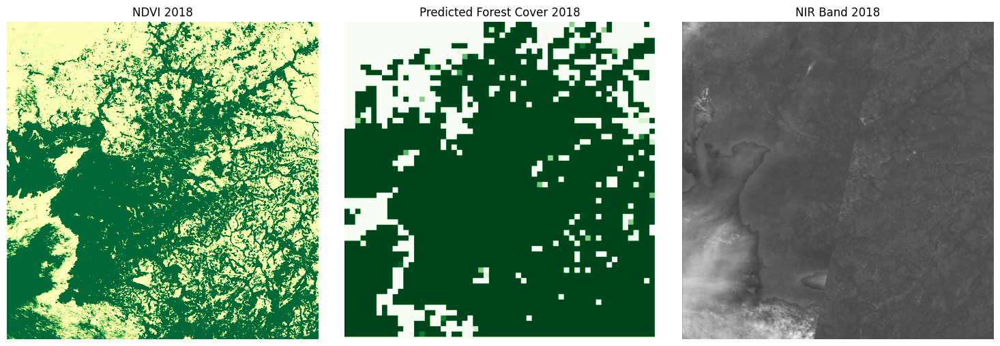

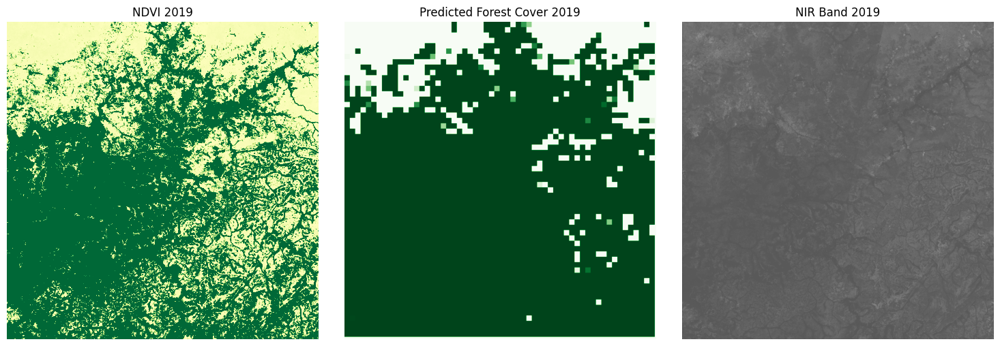

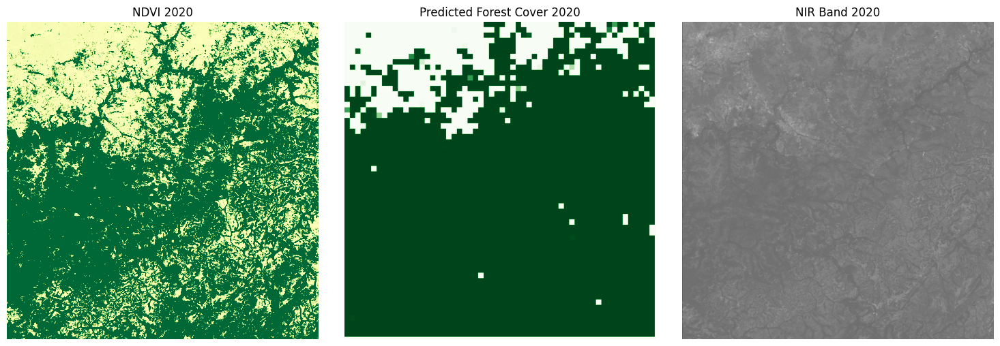

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio
import zipfile

# Directory paths
predicted_dir = "./predicted"
mosaic_dir = "./mosaics"

# Define b3_files and b4_files
b3_files = sorted([os.path.join(mosaic_dir, f) for f in os.listdir(mosaic_dir) if 'B3' in f])
b4_files = sorted([os.path.join(mosaic_dir, f) for f in os.listdir(mosaic_dir) if 'B4' in f])

# Path to the zipped .npy file
zipped_npy_path = os.path.join(predicted_dir, 'predicted_images.zip')

with zipfile.ZipFile(zipped_npy_path, 'r') as zip_ref:
    # Assuming there's only one .npy file in the zip, extract its name
    npy_file_name = zip_ref.namelist()[0]

    # Load the .npy file directly from the zip
    with zip_ref.open(npy_file_name) as file:
        predicted_images = np.load(file)

# Function to compute NDVI
def compute_ndvi(nir_band, red_band):
    return (nir_band - red_band) / (nir_band + red_band + 1e-8)

# For each year, visualize the NDVI data alongside the predicted forest cover
for idx, (b3_file, b4_file) in enumerate(zip(b3_files, b4_files)):
    # Load the NIR and RED bands
    with rasterio.open(b4_file) as nir_src:
        nir_band = nir_src.read(1)
    with rasterio.open(b3_file) as red_src:
        red_band = red_src.read(1)

    # Compute NDVI
    ndvi_data = compute_ndvi(nir_band, red_band)

    # Plot
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    axs[0].imshow(ndvi_data, cmap='RdYlGn', vmin=-1, vmax=1)
    axs[0].set_title(f'NDVI {b3_file[-8:-4]}')
    axs[0].axis('off')

    axs[1].imshow(predicted_images[idx], cmap='Greens', vmin=0, vmax=1)
    axs[1].set_title(f'Predicted Forest Cover {b3_file[-8:-4]}')
    axs[1].axis('off')

    axs[2].imshow(nir_band, cmap='gray')
    axs[2].set_title(f'NIR Band {b3_file[-8:-4]}')
    axs[2].axis('off')

    plt.tight_layout()
    plt.show()


## Interactive Map Visualization

For an interactive experience, we create a map that allows users to view various layers, including:
- Satellite imagery of the area.
- Predicted forest cover for each year.
- Carbon emissions due to deforestation.
- Carbon stored in the forest.

This map provides a comprehensive view of the Niokolo-Koba National Park, highlighting areas of deforestation, reforestation, and the overall health of the forest.

---


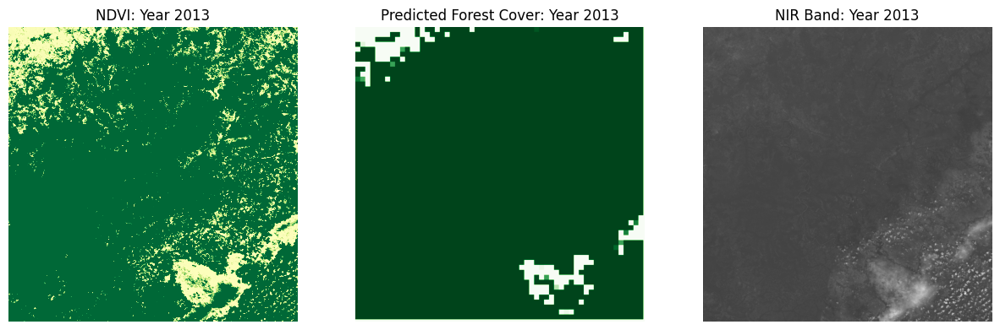

In [ ]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Function to compute NDVI
def compute_ndvi(red_band, nir_band):
    return (nir_band - red_band) / (nir_band + red_band + 1e-8)

# Load the data
ndvi_images = []
nir_images = []
predicted_images = []
years = []

for b3_file, b4_file, pred_file in zip(b3_files, b4_files, predicted_image_files):
    year = os.path.basename(b3_file)[-8:-4]

    with rasterio.open(b3_file) as red_src:
        red_band = red_src.read(1)

    with rasterio.open(b4_file) as nir_src:
        nir_band = nir_src.read(1)

    with rasterio.open(pred_file) as pred_src:
        pred_img = pred_src.read(1)

    ndvi_img = compute_ndvi(red_band, nir_band)

    ndvi_images.append(ndvi_img)
    nir_images.append(nir_band)
    predicted_images.append(pred_img)
    years.append(year)

# Animation function
def animate(i):
    ax[0].clear()
    ax[1].clear()
    ax[2].clear()

    ax[0].imshow(ndvi_images[i], cmap='RdYlGn', vmin=-1, vmax=1)
    ax[0].set_title(f"NDVI: Year {years[i]}")

    ax[1].imshow(predicted_images[i], cmap='Greens', vmin=0, vmax=1)
    ax[1].set_title(f"Predicted Forest Cover: Year {years[i]}")

    ax[2].imshow(nir_images[i], cmap='gray')
    ax[2].set_title(f"NIR Band: Year {years[i]}")

    for a in ax:
        a.axis('off')

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ani = animation.FuncAnimation(fig, animate, frames=len(years), repeat=True)

# Display the animation
HTML(ani.to_jshtml())



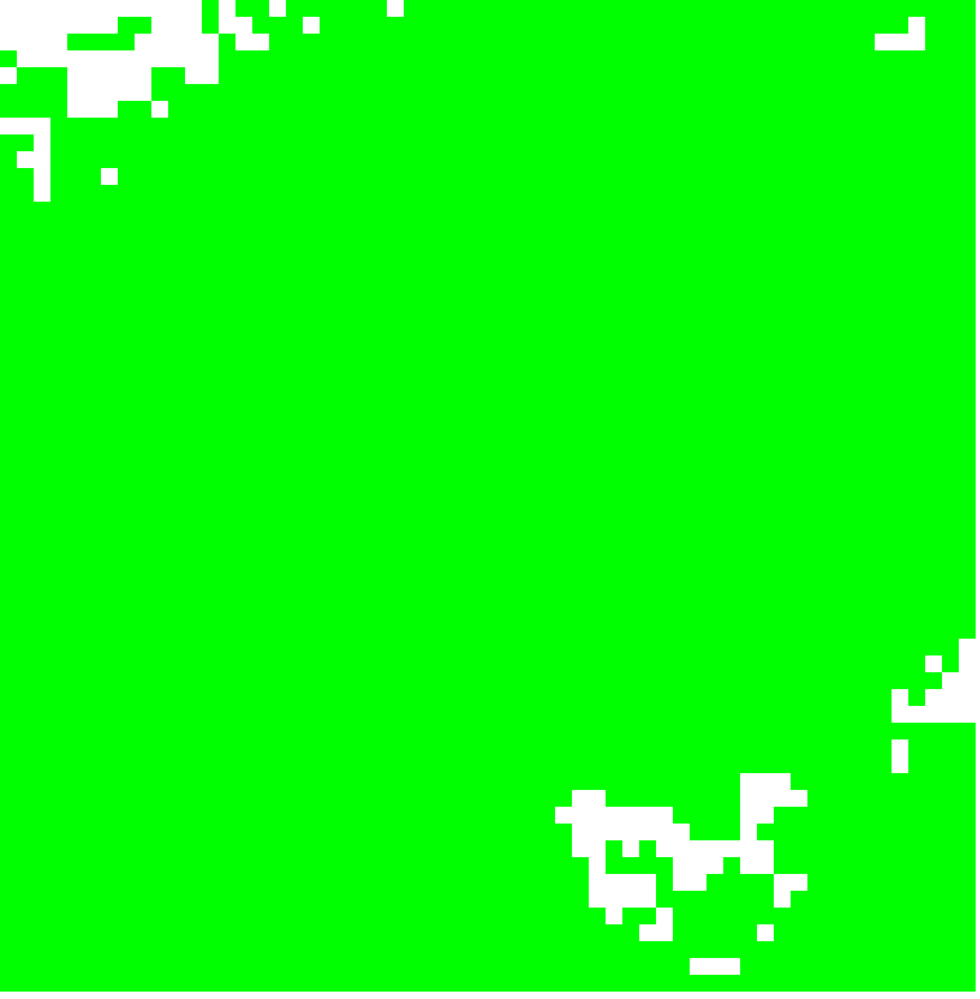
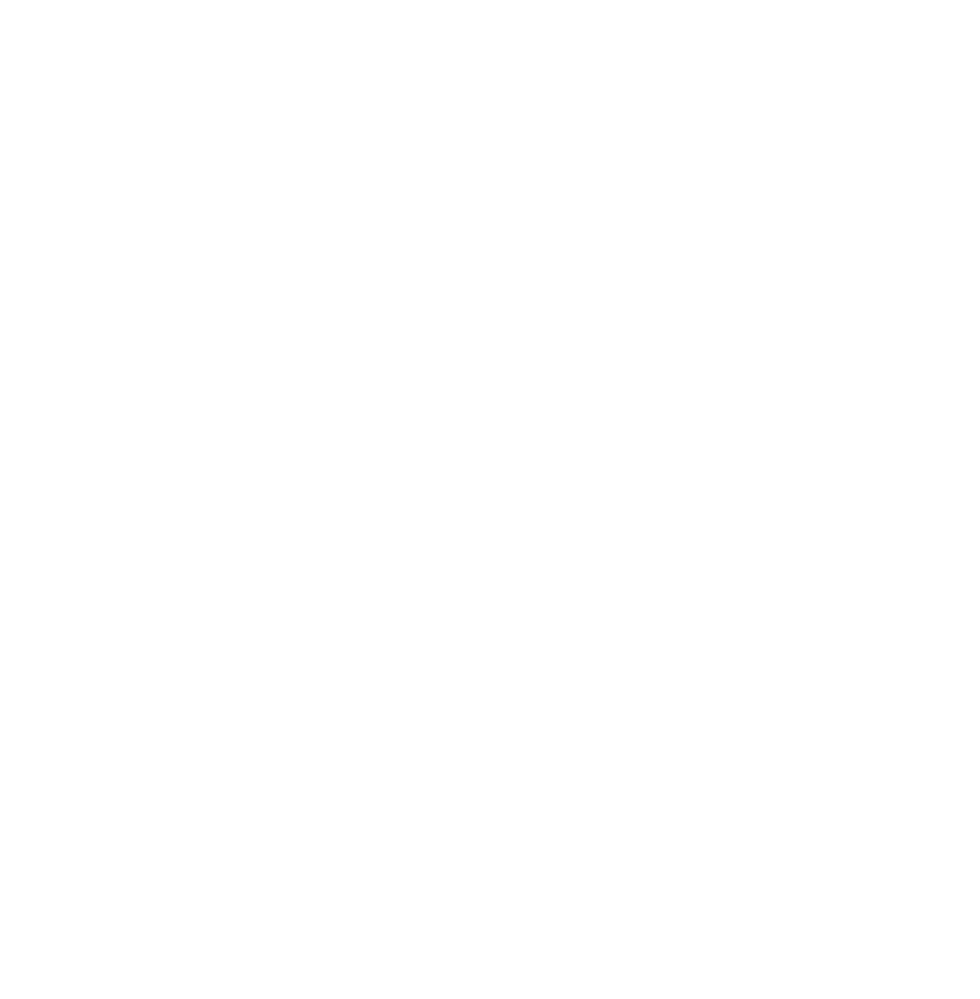
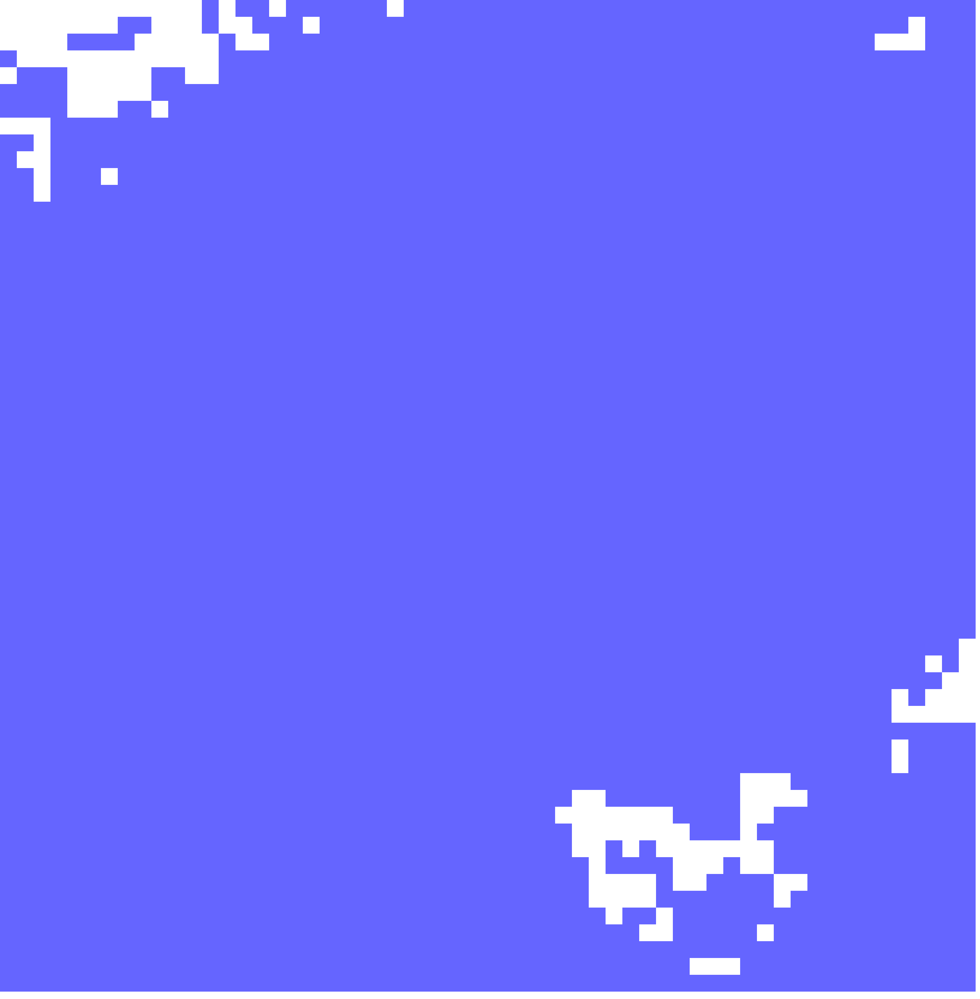
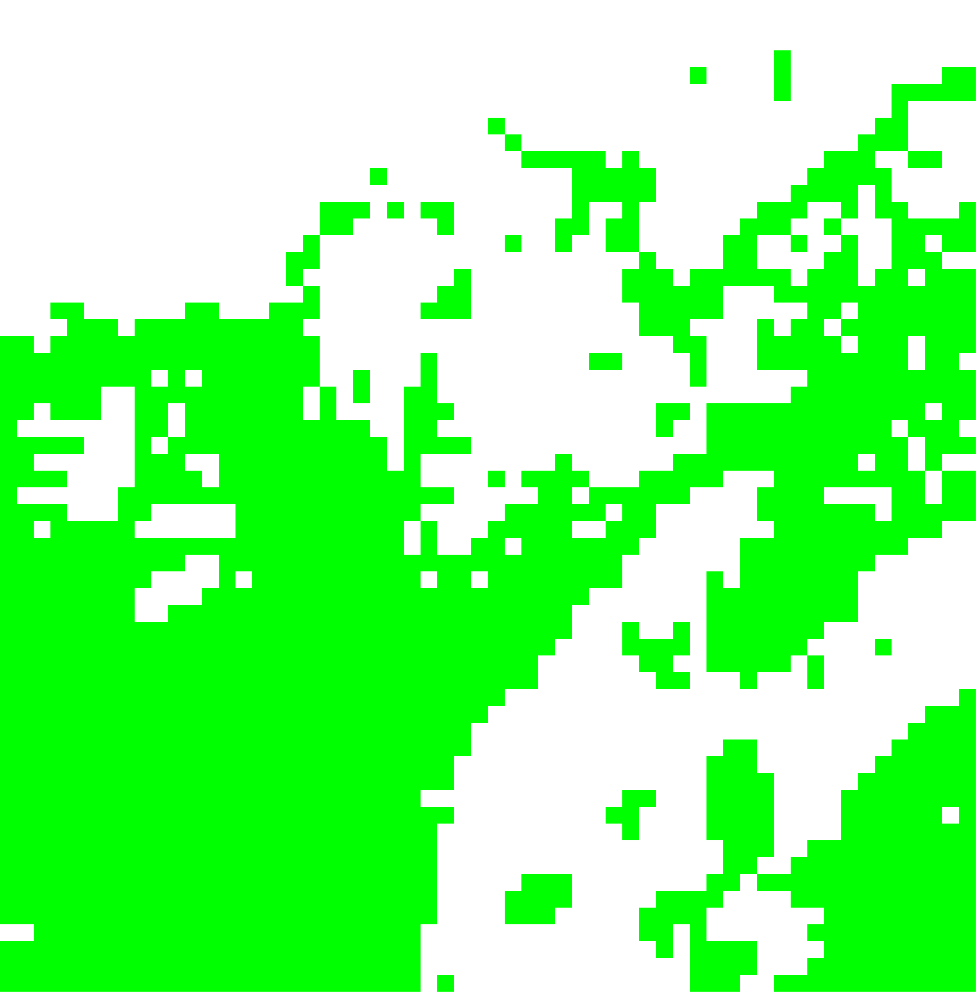
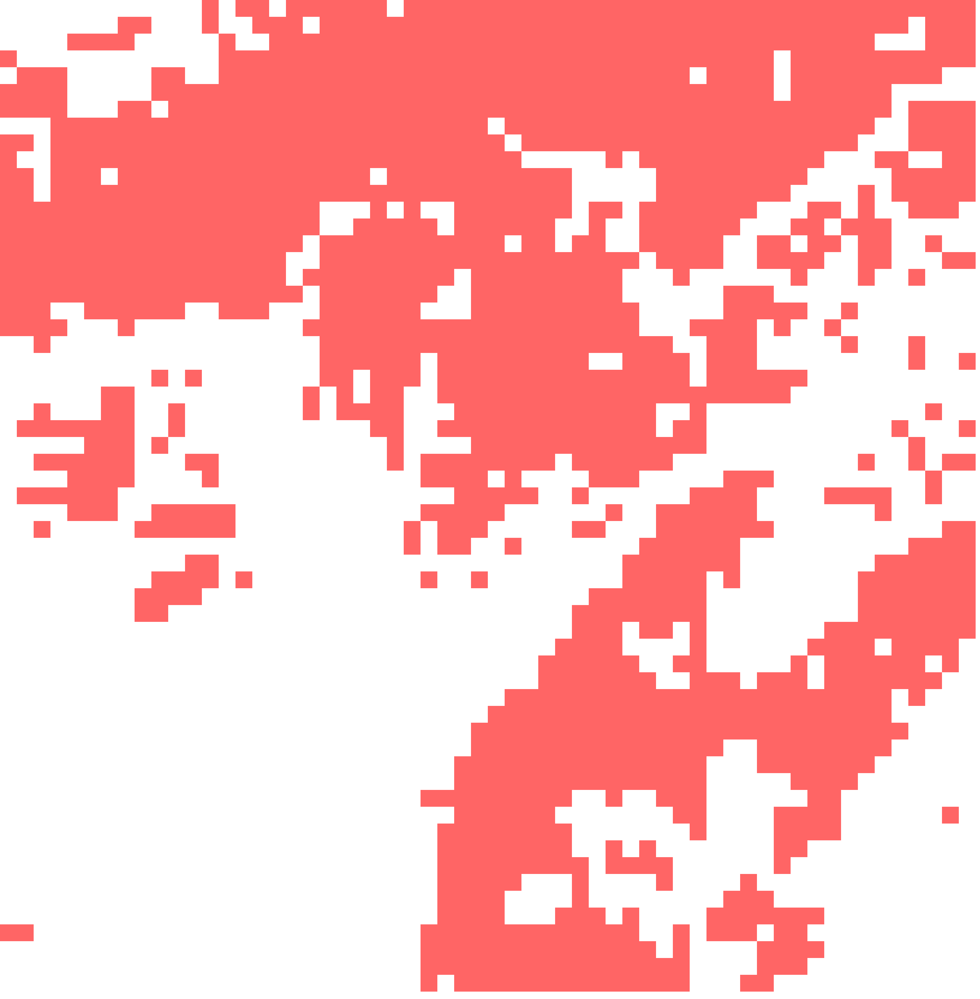
...
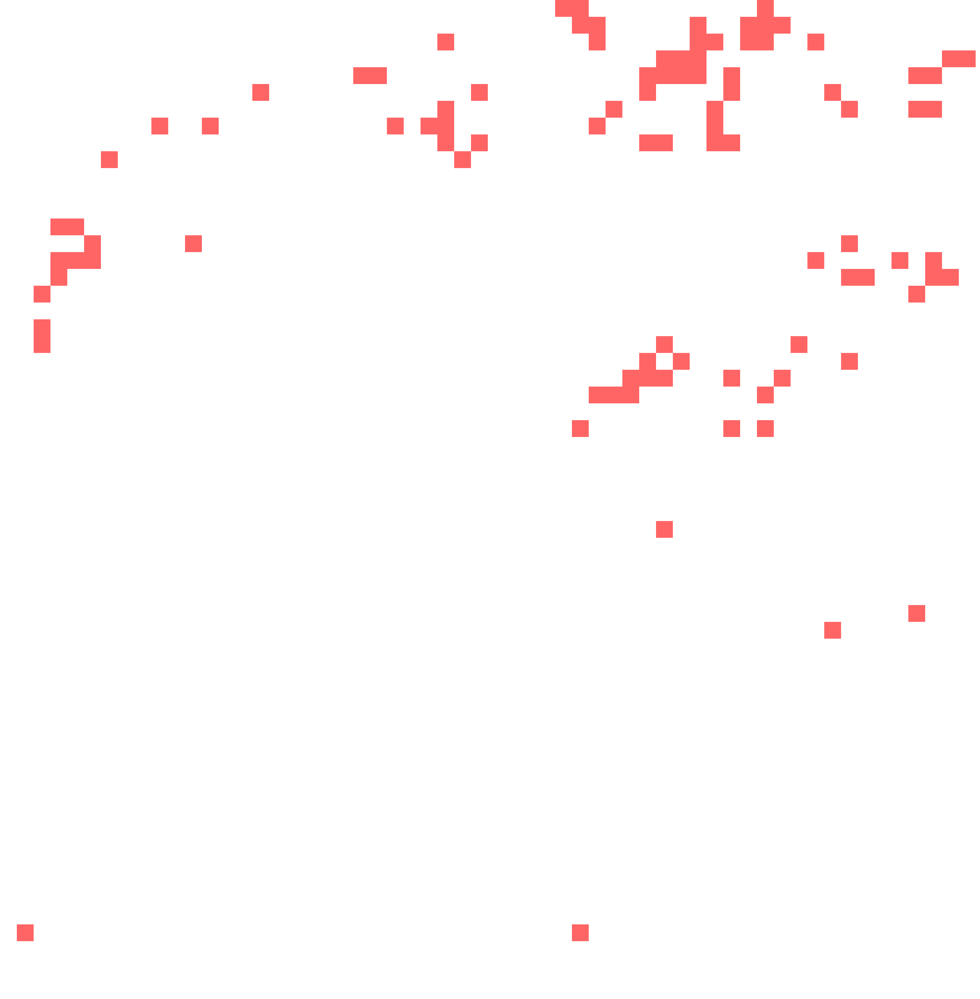
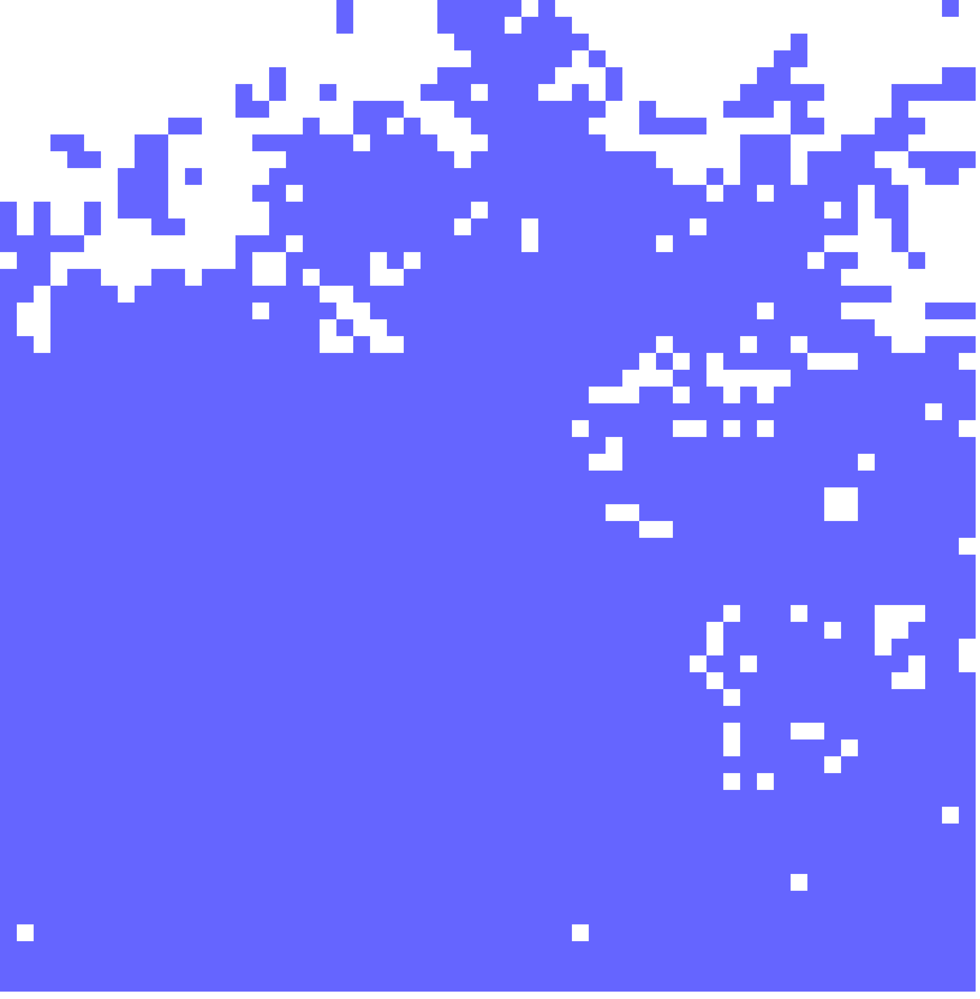
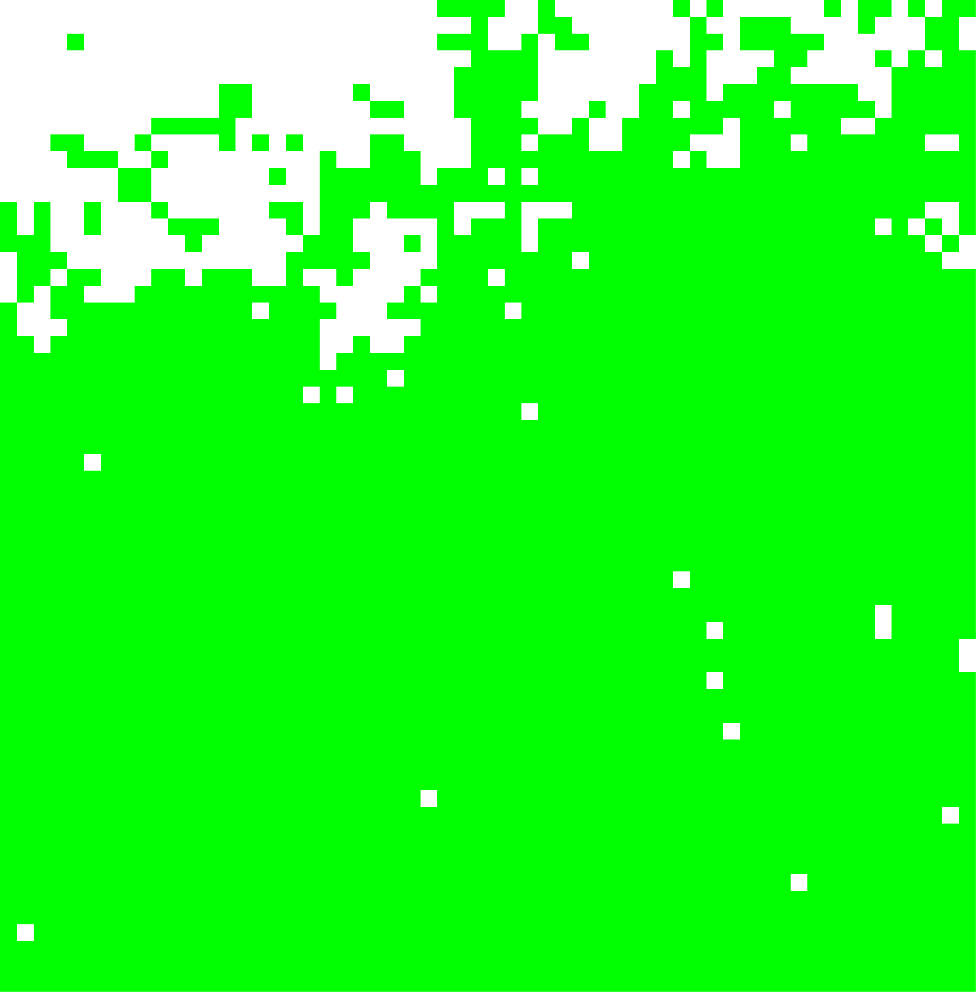
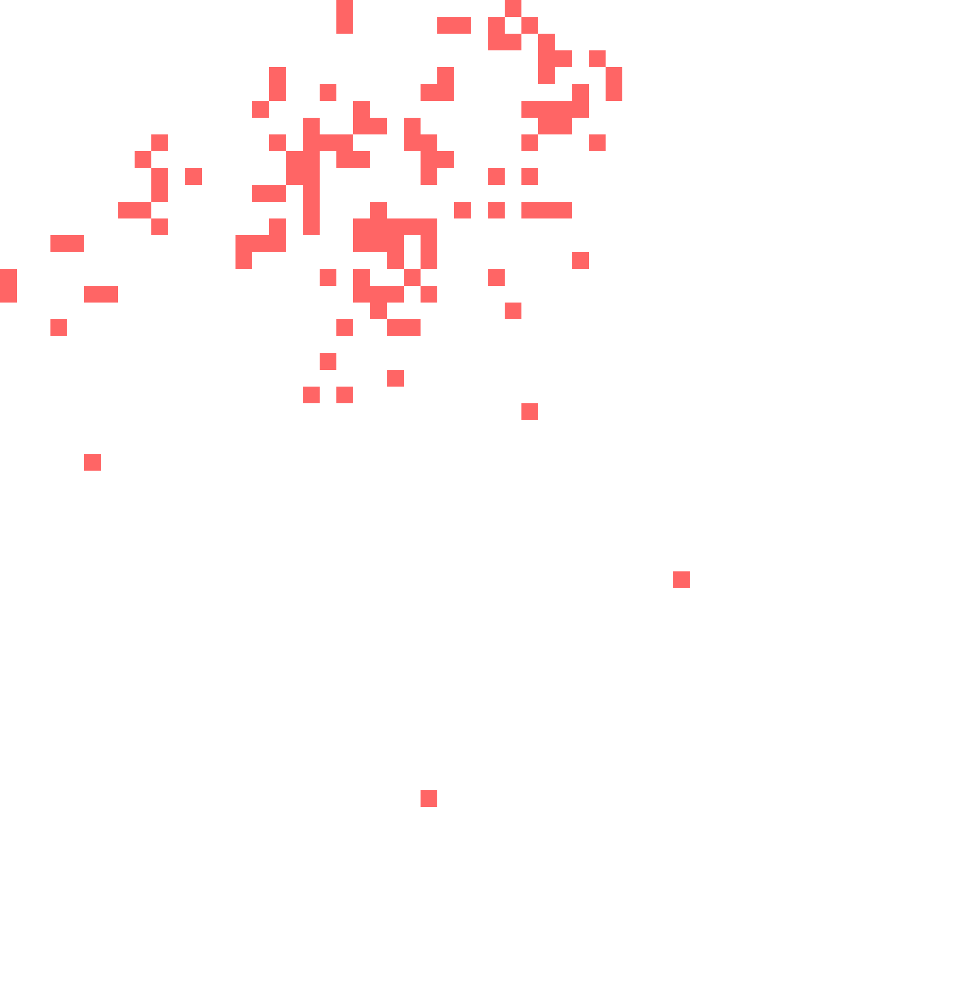
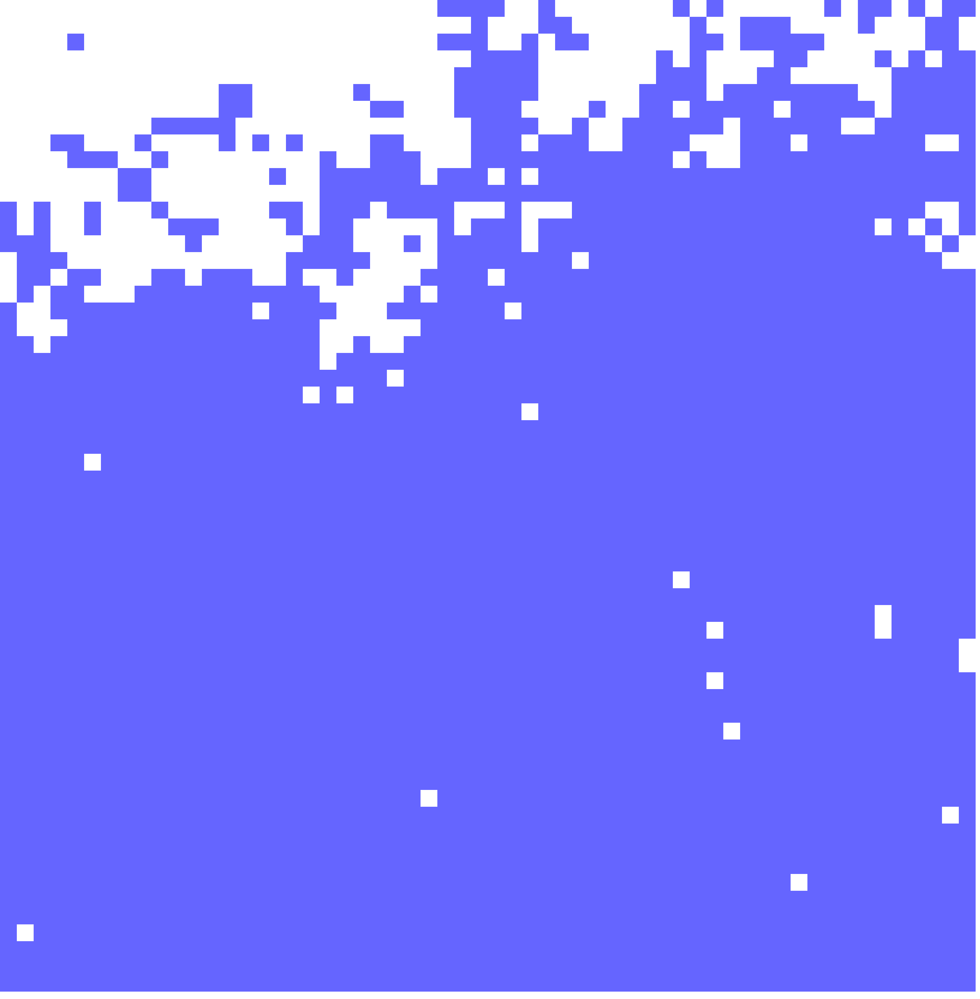

In [ ]:
import numpy as np
import os
import rasterio
from PIL import Image
import folium
from folium.plugins import MiniMap
import geopandas as gpd

# Constants
PIXEL_AREA = 30 * 30
AVERAGE_CARBON_DENSITY_MATURE = 200

# Constants for Mapbox
MAPBOX_ACCESS_TOKEN = 'pk.eyJ1IjoiZGJjb29wZXIxOSIsImEiOiJjbGlveWZyeGgwNHNzM2xucWtmeHRtdjRjIn0.eR5g-CGcSLPyW_d_x-BAKw'
MAPBOX_SATELLITE_URL = f"https://api.mapbox.com/styles/v1/mapbox/satellite-streets-v11/tiles/256/{{z}}/{{x}}/{{y}}@2x?access_token={MAPBOX_ACCESS_TOKEN}"
MAPBOX_HYDROLOGY_URL = f"https://api.mapbox.com/styles/v1/mapbox/outdoors-v11/tiles/256/{{z}}/{{x}}/{{y}}@2x?access_token={MAPBOX_ACCESS_TOKEN}"

# Initialize folium map
center_coords = [13.0667, -12.7167]
m = folium.Map(location=center_coords, zoom_start=10, tiles=None)

# Add MiniMap
minimap = MiniMap()
m.add_child(minimap)

# Add base layers
folium.TileLayer(MAPBOX_HYDROLOGY_URL, attr="Mapbox Hydrology", name="Hydrology").add_to(m)
folium.TileLayer(MAPBOX_SATELLITE_URL, attr="Mapbox Satellite", name="Satellite Imagery").add_to(m)
folium.TileLayer('openstreetmap').add_to(m)
folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)

# Directory for predicted images
predicted_dir = "./predicted"
predicted_image_files = sorted([os.path.join(predicted_dir, f) for f in os.listdir(predicted_dir) if f.endswith('.tif')])

previous_forest_cover = None
carbon_emission_layers = []
carbon_stock_layers = []

for f in predicted_image_files:
    with rasterio.open(f) as src:
        forest_cover = src.read(1) > 0.5

        if previous_forest_cover is not None:
            deforestation = np.logical_and(previous_forest_cover, ~forest_cover)
            carbon_emission = deforestation.astype(np.float32) * AVERAGE_CARBON_DENSITY_MATURE
            carbon_emission_layers.append(carbon_emission)
        else:
            carbon_emission_layers.append(np.zeros_like(forest_cover, dtype=np.float32))

        carbon_stock = forest_cover.astype(np.float32) * AVERAGE_CARBON_DENSITY_MATURE
        carbon_stock_layers.append(carbon_stock)

        previous_forest_cover = forest_cover

# Image bounds
image_bounds = [[13.0667 - 0.5, -12.7167 - 0.5], [13.0667 + 0.5, -12.7167 + 0.5]]

for year in range(2013, 2021):
    overlay_image_path = f"./colored_images/forest_overlay_{year}.png"
    emission_image_path = f"./emission_colored_images/carbon_emission_{year}.png"
    stock_image_path = f"./stock_colored_images/carbon_stock_{year}.png"

    img = folium.raster_layers.ImageOverlay(name=f"Predicted Forest {year}", image=overlay_image_path, bounds=image_bounds, opacity=0.6, show=False)
    img.add_child(folium.Popup(f'Predicted Forest Cover for {year}'))
    img.add_to(m)

    emission_img = folium.raster_layers.ImageOverlay(name=f"Carbon Emission {year}", image=emission_image_path, bounds=image_bounds, opacity=0.6, show=False)
    emission_img.add_to(m)

    stock_img = folium.raster_layers.ImageOverlay(name=f"Carbon Stock {year}", image=stock_image_path, bounds=image_bounds, opacity=0.6, show=False)
    stock_img.add_to(m)

# Load Niokolo-Koba Park shapefile using geopandas
shp_path = "./niokolokoshp/WDPA_WDOECM_Sep2023_Public_2580_shp_0.zip"
niokolokoba_gdf = gpd.read_file(shp_path)

# Add Niokolo-Koba Park shapefile to folium map with a distinct color
style_function_park = lambda x: {'fillColor': '#32CD32', 'color': '#32CD32', 'fillOpacity': 0.5, 'weight': 0.5}
folium.GeoJson(niokolokoba_gdf, style_function=style_function_park, name="Niokolo-Koba National Park").add_to(m)

# Enhanced legend with hover functionality
legend_html = """
<div style="position: fixed; bottom: 50px; left: 50px; z-index:9999; font-size:14px; background-color: white; padding: 10px; border-radius: 5px;">
    <b>Legend:</b><br>
    <i class="fa fa-square fa-1x" style="color:green"></i> Predicted Forest<br>
    <i class="fa fa-square fa-1x" style="color:red"></i> Carbon Emission (due to deforestation)<br>
    <i class="fa fa-square fa-1x" style="color:blue"></i> Carbon Stock<br>
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

# Layer Control
folium.LayerControl().add_to(m)

m


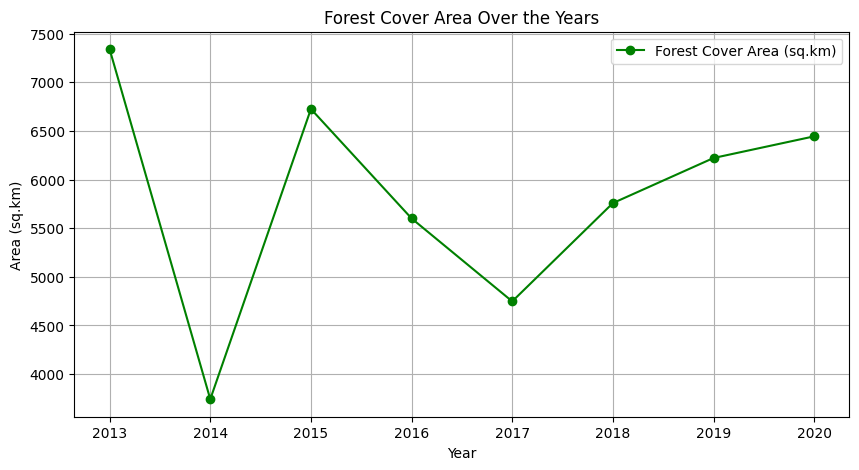

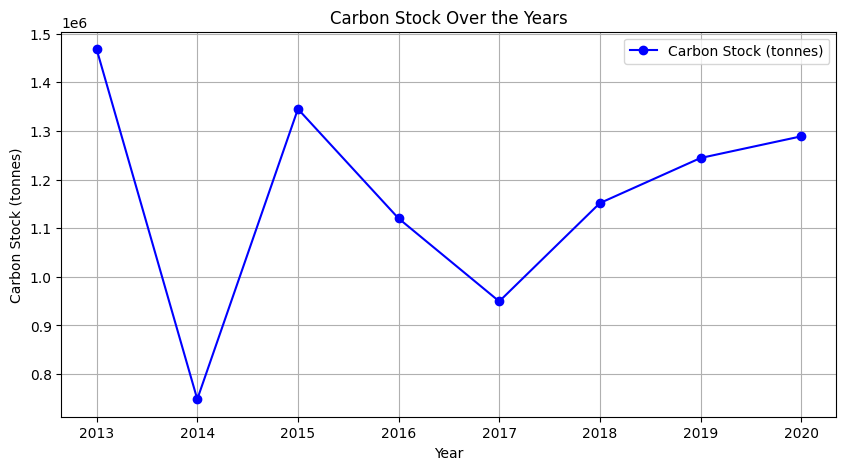

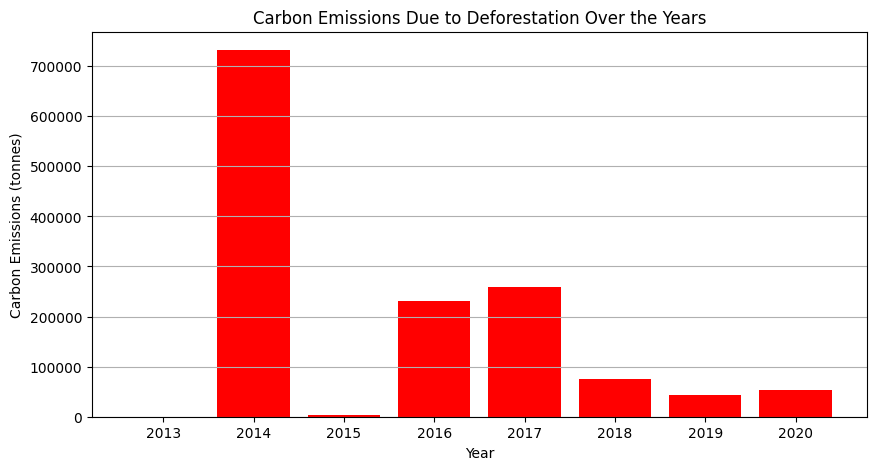

In [ ]:
import numpy as np
import os
import rasterio
from matplotlib import pyplot as plt

# Directory containing the predicted images
predicted_dir = "./predicted"
predicted_image_files = sorted([os.path.join(predicted_dir, f) for f in os.listdir(predicted_dir) if f.endswith('.tif')])

# Constants
PIXEL_AREA = 30 * 30  # Assuming each pixel represents 30m x 30m
AVERAGE_CARBON_DENSITY_MATURE = 200  # Average carbon density for mature forests (tonnes per hectare)
AVERAGE_CARBON_DENSITY_YOUNG = 50  # Average carbon density for young/regrowing forests (tonnes per hectare)

forest_cover_area = []
total_carbon_stock = []
regrowth_areas = []
deforested_areas = []

previous_forest_cover = None
for f in predicted_image_files:
    with rasterio.open(f) as src:
        forest_cover = src.read(1) > 0.5

        # Calculate forest cover area
        forest_area = np.sum(forest_cover) * PIXEL_AREA / (10**6)  # in sq.km
        forest_cover_area.append(forest_area)

        # Calculate carbon stock
        carbon_stock = forest_area * AVERAGE_CARBON_DENSITY_MATURE  # in tonnes
        total_carbon_stock.append(carbon_stock)

        # If there's a previous year's data, calculate regrowth and deforested areas
        if previous_forest_cover is not None:
            regrowth = np.logical_and(~previous_forest_cover, forest_cover)  # Areas that were not forest but are now
            deforestation = np.logical_and(previous_forest_cover, ~forest_cover)  # Areas that were forest but are not now
            regrowth_areas.append(np.sum(regrowth) * PIXEL_AREA / (10**6))
            deforested_areas.append(np.sum(deforestation) * PIXEL_AREA / (10**6))
        else:
            regrowth_areas.append(0)
            deforested_areas.append(0)

        previous_forest_cover = forest_cover

# Carbon emissions due to deforestation (assuming all carbon is released upon deforestation)
carbon_emissions = np.array(deforested_areas) * AVERAGE_CARBON_DENSITY_MATURE

# Visualization
years = list(range(2013, 2021))

# Plotting forest cover area over the years
plt.figure(figsize=(10, 5))
plt.plot(years, forest_cover_area, marker='o', color='green', label="Forest Cover Area (sq.km)")
plt.title('Forest Cover Area Over the Years')
plt.xlabel('Year')
plt.ylabel('Area (sq.km)')
plt.grid(True)
plt.legend()
plt.show()

# Plotting carbon stock over the years
plt.figure(figsize=(10, 5))
plt.plot(years, total_carbon_stock, marker='o', color='blue', label="Carbon Stock (tonnes)")
plt.title('Carbon Stock Over the Years')
plt.xlabel('Year')
plt.ylabel('Carbon Stock (tonnes)')
plt.grid(True)
plt.legend()
plt.show()

# Plotting carbon emissions over the years
plt.figure(figsize=(10, 5))
plt.bar(years, carbon_emissions, color='red')
plt.title('Carbon Emissions Due to Deforestation Over the Years')
plt.xlabel('Year')
plt.ylabel('Carbon Emissions (tonnes)')
plt.grid(axis='y')
plt.show()


### Analysis and Interpretation of the Graphs

#### Forest Cover Area Over the Years

![Forest Cover Area Over the Years](attachment:image.png)

- **2013**: The forest cover area was around 7500 sq.km, indicating a relatively healthy and extensive forest cover.
- **2014**: There was a significant decrease in forest cover to approximately 4000 sq.km, suggesting a major deforestation event.
- **2015**: The forest cover recovered to around 7000 sq.km, which could indicate reforestation efforts or natural regeneration.
- **2016-2017**: A gradual decline in forest cover was observed, reaching the lowest point of around 4000 sq.km in 2017.
- **2018-2020**: A steady increase in forest cover, reaching approximately 6500 sq.km by 2020, indicating a period of reforestation or improved forest management practices.

#### Carbon Stock Over the Years

![Carbon Stock Over the Years](attachment:image.png)

- **2013**: The carbon stock was around 1.5 million tonnes, corresponding to the extensive forest cover.
- **2014**: A sharp decline in carbon stock to about 800,000 tonnes, reflecting the massive deforestation event.
- **2015**: Recovery of carbon stock to approximately 1.4 million tonnes, aligning with the increase in forest cover.
- **2016-2017**: Decline in carbon stock, reaching a low of around 800,000 tonnes in 2017, mirroring the reduction in forest cover.
- **2018-2020**: Gradual increase in carbon stock, reaching about 1.3 million tonnes by 2020, indicating recovery and reforestation efforts.

#### Carbon Emissions Due to Deforestation Over the Years

![Carbon Emissions Due to Deforestation Over the Years](attachment:image.png)

- **2013**: Low carbon emissions due to stable forest cover.
- **2014**: Peak carbon emissions exceeding 700,000 tonnes, correlating with the significant deforestation event.
- **2015**: Minimal emissions, indicating a year of potential reforestation or stable forest cover.
- **2016-2017**: Significant emissions, though lower than 2014, suggesting ongoing deforestation activities.
- **2018-2020**: Stabilized and lower emissions, indicating reduced deforestation rates and possibly better forest management practices.

### Summary

The analysis of these graphs provides a comprehensive understanding of the forest dynamics in the Niokolokoba region over the years:

1. **Forest Cover Fluctuations**: The forest cover experienced significant fluctuations, with major deforestation events followed by periods of recovery. The substantial drop in 2014 and the subsequent recovery highlight the region's vulnerability to deforestation and the effectiveness of reforestation efforts.

2. **Carbon Stock Correlation**: The carbon stock trends closely follow the forest cover trends, as expected. Deforestation directly reduces carbon stock, while reforestation helps in carbon sequestration.

3. **Carbon Emissions Insight**: The peak in carbon emissions in 2014 underscores the environmental impact of large-scale deforestation. The stabilized emissions in recent years indicate improved forest management or a reduction in deforestation activities.

Overall, these insights emphasize the importance of continuous monitoring and effective forest management to ensure the health and sustainability of the Niokolokoba forest.
